# Statistical Analysis on factors influencing Life Expectancy 

## Table of Contents
#### 1. Problem Statement
#### 2. Objective
#### 3. Data Collection
#### 4. Data Description
#### 5. EDA
#### 6. Data Preprocessing
#### 7. Visualization
#### 8. Feature Engineering
#### 9. Data Splitting
#### 10. Model Selection
#### 11. Model Training & Evaluation
#### 12. Feature Selection
#### 13. Hyperparameter Tuning
#### 14. Conclusion
#### 15. Save the Model

## Problem Statement

Life expectancy is a critical indicator of a country's overall health and well-being. It reflects the average number of years a person can expect to live based on the current mortality rates and conditions in a specific country. 
The problem is to understand and analyze the statistical relationships between life expectancy and various factors, such as adult mortality, infant deaths, alcohol consumption, healthcare expenditure, immunization rates, GDP, and other socio-economic indicators. By building a machine learning model, my aim is to identify significant predictors of life expectancy and quantify their impacts.

## Objective

Develop a predictive model to accurately estimate life expectancy based on socioeconomic and health-related factors, providing insights for policy-making and healthcare improvements.

In [8]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

## Data Collection

In [9]:
import pandas as pd
df= pd.read_csv("LifeExpectancy.csv")
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [10]:
df.tail()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.0,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.0,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.0,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.0,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8
2937,Zimbabwe,2000,Developing,46.0,665.0,24,1.68,0.0,79.0,1483,...,78.0,7.10,78.0,43.5,547.358878,12222251.0,11.0,11.2,0.434,9.8


## Data Description

Dataset : https://www.kaggle.com/datasets/kumarajarshi/life-expectancy-who/data

This dataset contains 2 columns containing textual information.

Name: a country's name
Status: a country's economic class (Developed or Developing status).

The dataset also contains several numerical columns:

Year: the year that the data was observed
Life expectancy: the number of years that an average person can be expected to live
Adult Mortality: this is the probability that a person aged 15 years old will die before they reach the age of 60 (in a population per 1000 people)
Infant deaths: the number of infant deaths (in a population per 1000 people)
Alcohol: pure alcohol consumption per capita of persons aged over 
percentage expenditure: the percentage of a country's GDP per capita expended on healthcare
Hepatitis B: the percentage of Hepatitis B immunization among children aged 1 year old
Measles: the number of Measles cases reported (in a population per 1000 people)
BMI: the average body mass index value of the country's population
under-five deaths: the number of deaths (in a population per 1000 people) of children under 5 years of age
Polio: the percentage of Polio immunization among children aged 1 year old
Total expenditure: the percentage of total government expenditure allocated to general healthcare expenditure.
Diphtheria: the percentage of Diphtheria, Tetanus, Toxoid, Prtussis (DTP3) immunization among children aged 1 year old
HIV/AIDS: the number of HIV/AIDS deaths (per 1000 live births) of children under 4 years
GDP: the Gross Domestic Product value per capita calculated in USD
Population: the country's population
thinness 1-19 years: the percentage thinness of children aged between 1 and 19 years
thinness 5-9 years: the percentage thinness of children aged between 5 and 9 years
Income composition of resources: the Human Development Index value (0-1) in reference to a country's configuration of resources
Schooling: the mean number of years of schooling of age.15 in Litres

## EDA (Exploratory Data Analysis) 


### Check the shape of Dataset

In [11]:
#shape
df.shape

(2938, 22)

##### There are 2938 rows and 22 columns in the dataset.

In [12]:
#info()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [13]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [14]:
df.columns=df.columns.str.replace(" ","")
df.columns

Index(['Country', 'Year', 'Status', 'Lifeexpectancy', 'AdultMortality',
       'infantdeaths', 'Alcohol', 'percentageexpenditure', 'HepatitisB',
       'Measles', 'BMI', 'under-fivedeaths', 'Polio', 'Totalexpenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness1-19years',
       'thinness5-9years', 'Incomecompositionofresources', 'Schooling'],
      dtype='object')

### Identify numerical and categorical columns

In [15]:
# Numerical columns
num_cols = df.select_dtypes(include='number').columns
print(num_cols)

Index(['Year', 'Lifeexpectancy', 'AdultMortality', 'infantdeaths', 'Alcohol',
       'percentageexpenditure', 'HepatitisB', 'Measles', 'BMI',
       'under-fivedeaths', 'Polio', 'Totalexpenditure', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness1-19years',
       'thinness5-9years', 'Incomecompositionofresources', 'Schooling'],
      dtype='object')


In [16]:
cat_cols = df.select_dtypes(include='object').columns
print(cat_cols )

Index(['Country', 'Status'], dtype='object')


##### Out of 22 columns, 2 are categorical and 20 are numerical

### Checking for null values

In [17]:
# finding missing values
df.isnull().sum()

Country                           0
Year                              0
Status                            0
Lifeexpectancy                   10
AdultMortality                   10
infantdeaths                      0
Alcohol                         194
percentageexpenditure             0
HepatitisB                      553
Measles                           0
BMI                              34
under-fivedeaths                  0
Polio                            19
Totalexpenditure                226
Diphtheria                       19
HIV/AIDS                          0
GDP                             448
Population                      652
thinness1-19years                34
thinness5-9years                 34
Incomecompositionofresources    167
Schooling                       163
dtype: int64

In [18]:
# Percentage of missing values in each column
df.isnull().sum()/df.shape[0]*100

Country                          0.000000
Year                             0.000000
Status                           0.000000
Lifeexpectancy                   0.340368
AdultMortality                   0.340368
infantdeaths                     0.000000
Alcohol                          6.603131
percentageexpenditure            0.000000
HepatitisB                      18.822328
Measles                          0.000000
BMI                              1.157250
under-fivedeaths                 0.000000
Polio                            0.646698
Totalexpenditure                 7.692308
Diphtheria                       0.646698
HIV/AIDS                         0.000000
GDP                             15.248468
Population                      22.191967
thinness1-19years                1.157250
thinness5-9years                 1.157250
Incomecompositionofresources     5.684139
Schooling                        5.547992
dtype: float64

#### If percentage of missing values is greater than 50%, we can drop that columns.

#### Checking for Duplicates

In [19]:
# finding duplicates
df.duplicated().sum()

0

#### There are no duplicate values

### Understand the distribution of data


In [20]:
# Descriptive statistics
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,2938.0,2.007519e+03,4.613841e+00,2000.00000,2004.000000,2.008000e+03,2.012000e+03,2.015000e+03
Lifeexpectancy,2928.0,6.922493e+01,9.523867e+00,36.30000,63.100000,7.210000e+01,7.570000e+01,8.900000e+01
AdultMortality,2928.0,1.647964e+02,1.242921e+02,1.00000,74.000000,1.440000e+02,2.280000e+02,7.230000e+02
infantdeaths,2938.0,3.030395e+01,1.179265e+02,0.00000,0.000000,3.000000e+00,2.200000e+01,1.800000e+03
Alcohol,2744.0,4.602861e+00,4.052413e+00,0.01000,0.877500,3.755000e+00,7.702500e+00,1.787000e+01
percentageexpenditure,2938.0,7.382513e+02,1.987915e+03,0.00000,4.685343,6.491291e+01,4.415341e+02,1.947991e+04
HepatitisB,2385.0,8.094046e+01,2.507002e+01,1.00000,77.000000,9.200000e+01,9.700000e+01,9.900000e+01
Measles,2938.0,2.419592e+03,1.146727e+04,0.00000,0.000000,1.700000e+01,3.602500e+02,2.121830e+05
BMI,2904.0,3.832125e+01,2.004403e+01,1.00000,19.300000,4.350000e+01,5.620000e+01,8.730000e+01
under-fivedeaths,2938.0,4.203574e+01,1.604455e+02,0.00000,0.000000,4.000000e+00,2.800000e+01,2.500000e+03


In [21]:
df.describe(include="object").T

,count,unique,top,freq
Country,2938,193,Afghanistan,16
Status,2938,2,Developing,2426


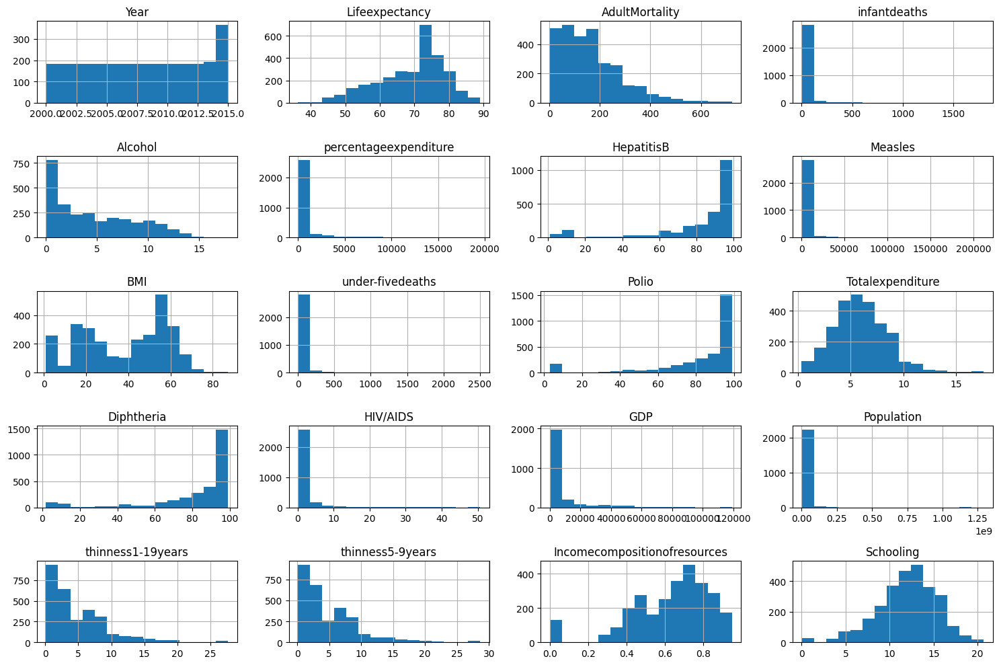

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Histograms for numerical columns
df[num_cols].hist(bins=15, figsize=(15, 10), layout=(5, 4))
plt.tight_layout()
plt.show()


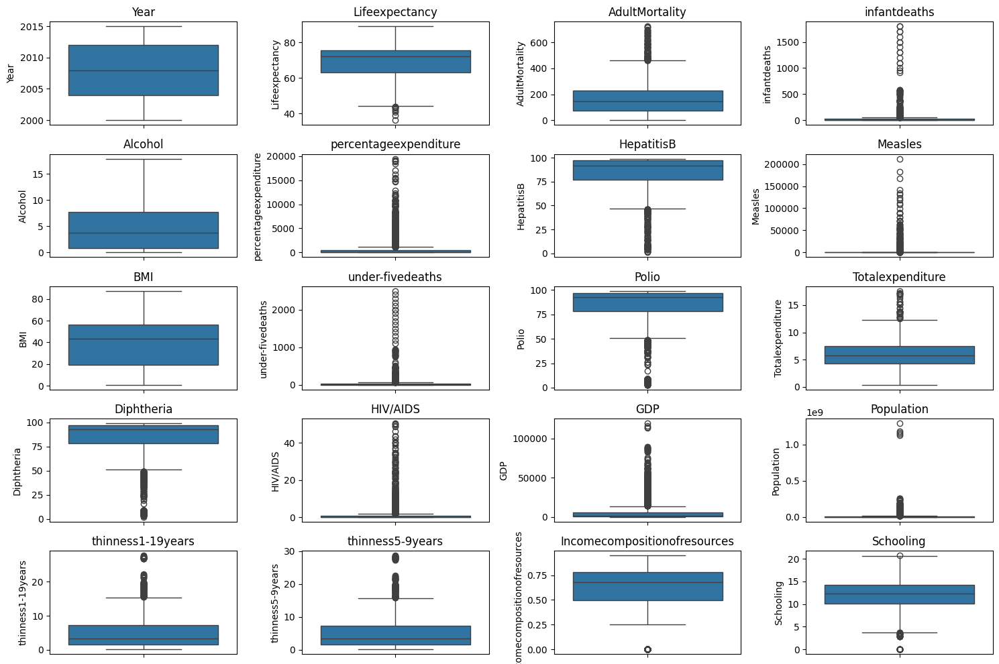

In [23]:
#box plot to identify outliers
plt.figure(figsize=(15, 10))
#enumerate() is a built-in Python function that allows you to loop over an iterable (like a list) and have an automatic counter.
for i, col in enumerate(num_cols):
    plt.subplot(5, 4, i+1)
    sns.boxplot(y=df[col])
    plt.title(col)
plt.tight_layout()
plt.show()

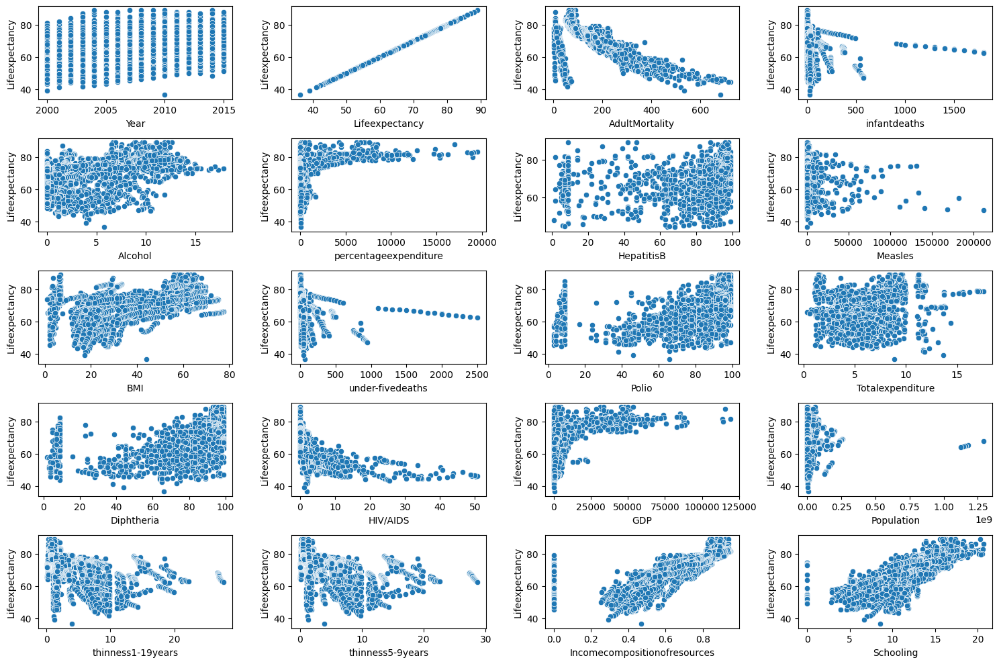

In [24]:
# scatter plot to identify the relationship between dependent (Life expectancy) and independent features
plt.figure(figsize=(15, 10))
for i, col in enumerate(num_cols):
    plt.subplot(5, 4, i+1)
    sns.scatterplot(data=df,x=col,y='Lifeexpectancy')
    plt.xlabel(col)
plt.tight_layout()
plt.show()

### Skewness and Kurtosis

In [25]:
from scipy.stats import skew, kurtosis

# Calculate skewness and kurtosis
skewness = df[num_cols].apply(skew)
kurt = df[num_cols].apply(lambda x: kurtosis(x, fisher=False))

print(skewness)
print(kurt)

# Identify positive and negative skewness (absolute value > 1)
positive_skewness = skewness[skewness > 1]
negative_skewness = skewness[skewness < -1]

print('Variables with positive skewness (skew > 1):\n', positive_skewness)
print('Variables with negative skewness (skew < -1):\n', negative_skewness)

# Identify platykurtic (kurtosis < 3) and leptokurtic (kurtosis > 3) distributions
platykurtic = kurt[kurt < 3]
leptokurtic = kurt[kurt > 3]

print('Variables with platykurtic distribution (kurtosis < 3):\n', platykurtic)
print('Variables with leptokurtic distribution (kurtosis > 3):\n', leptokurtic)

Year                           -0.006406
Lifeexpectancy                       NaN
AdultMortality                       NaN
infantdeaths                    9.781965
Alcohol                              NaN
percentageexpenditure           4.649676
HepatitisB                           NaN
Measles                         9.436511
BMI                                  NaN
under-fivedeaths                9.490216
Polio                                NaN
Totalexpenditure                     NaN
Diphtheria                           NaN
HIV/AIDS                        5.393357
GDP                                  NaN
Population                           NaN
thinness1-19years                    NaN
thinness5-9years                     NaN
Incomecompositionofresources         NaN
Schooling                            NaN
dtype: float64
Year                              1.786301
Lifeexpectancy                         NaN
AdultMortality                         NaN
infantdeaths                    118.

##### Some columns are showing as NaN as it contains null values.

### Correlation

<Axes: >

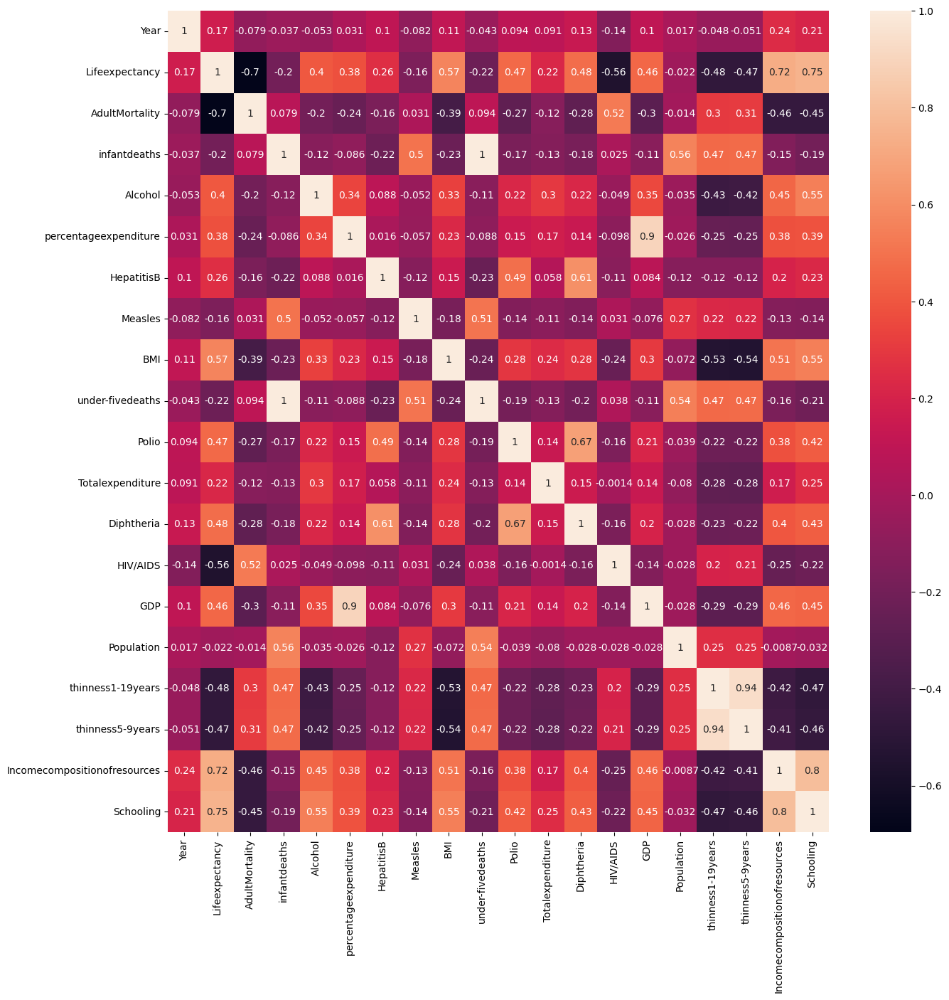

In [26]:
# correlation with heatmap to interpret the relation and multicolliniarity
plt.figure(figsize=(15,15))
sns.heatmap(df[num_cols].corr(),annot=True)

#### Columns with multicollinearity
##### infantdeaths and under-fivedeaths 
##### percentageexpenditure and GDP
##### Polio and Diphtheria
##### thinness1-19years and thinness5-9years
##### Incomecompositionofresources and Schooling

<Axes: xlabel='Incomecompositionofresources', ylabel='Schooling'>

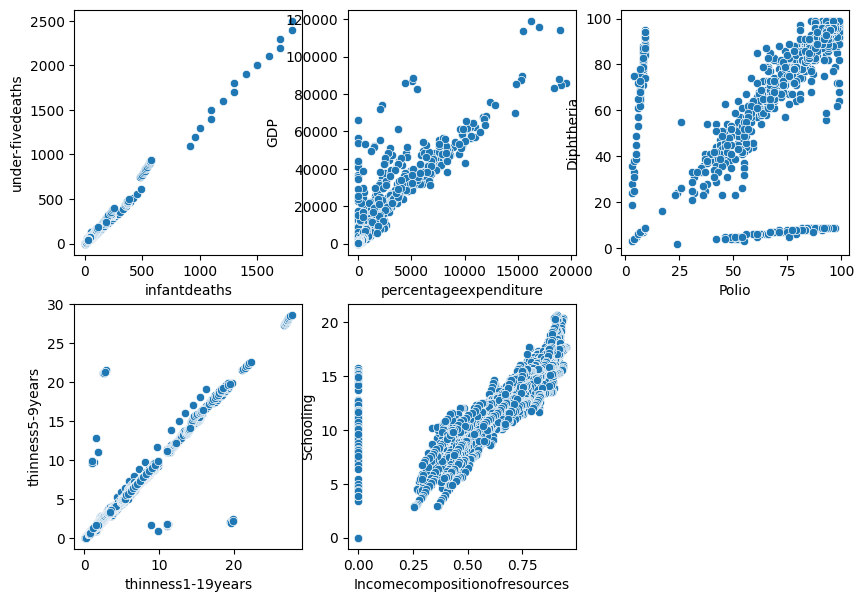

In [27]:
plt.figure(figsize=(10, 7))
plt.subplot(2,3,1)
sns.scatterplot(data=df,x='infantdeaths',y='under-fivedeaths')

plt.subplot(2,3,2)
sns.scatterplot(data=df,x='percentageexpenditure',y='GDP')

plt.subplot(2,3,3)
sns.scatterplot(data=df,x='Polio',y='Diphtheria')

plt.subplot(2,3,4)
sns.scatterplot(data=df,x='thinness1-19years',y='thinness5-9years')

plt.subplot(2,3,5)
sns.scatterplot(data=df,x='Incomecompositionofresources',y='Schooling')

#### We can drop the columns infantdeaths, percentageexpenditure, Polio, thinness1-19years, Incomecompositionofresources

#### Columns highly correlated with LifeExpectancy
##### BMI, HIV/AIDS, Income composition of resources, Schooling

#### Analysing Categorical columns

In [28]:
for col in cat_cols:
    print(f"Values in {col}:\n{df[col].unique()}")
    print(f"Number of unique values in {col}: {df[col].nunique()}\n")


Values in Country:
['Afghanistan' 'Albania' 'Algeria' 'Angola' 'Antigua and Barbuda'
 'Argentina' 'Armenia' 'Australia' 'Austria' 'Azerbaijan' 'Bahamas'
 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin'
 'Bhutan' 'Bolivia (Plurinational State of)' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'Brunei Darussalam' 'Bulgaria' 'Burkina Faso'
 'Burundi' "Côte d'Ivoire" 'Cabo Verde' 'Cambodia' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' 'Croatia' 'Cuba' 'Cyprus' 'Czechia'
 "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Equatorial Guinea'
 'Eritrea' 'Estonia' 'Ethiopia' 'Fiji' 'Finland' 'France' 'Gabon' 'Gambia'
 'Georgia' 'Germany' 'Ghana' 'Greece' 'Grenada' 'Guatemala' 'Guinea'
 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras' 'Hungary' 'Iceland' 'India'
 'Indonesia' 'Iran (Is

#### There are 193 unique values in country column and 2 unique values in Status column.

#### Cross tabulation

In [29]:
pd.crosstab(df["Lifeexpectancy"], df["Status"], margins=True)

Status,Developed,Developing,All
Lifeexpectancy,,,
36.3,0,1,1
39.0,0,1,1
41.0,0,1,1
41.5,0,1,1
42.3,0,1,1
...,...,...,...
86.0,12,3,15
87.0,6,3,9
88.0,9,1,10


- This table helps you understand the distribution of Lifeexpectancy values across "Developed" and "Developing" countries.
- The rows represent different Lifeexpectancy values.
- The columns represent the Status categories, which are "Developed" and "Developing".
- There are 512 instances for "Developed" and 2416 instances for "Developing," making a total of 2928 instances.
- For Lifeexpectancy of 36.3, there is 1 instance in "Developing" countries and none in "Developed" countries.
- For Lifeexpectancy of 86.0, there are 12 instances in "Developed" countries and 3 in "Developing" countries, making a total of 15 instaces.
..

# Expected EDA Questions

### 1. What is the size and structure of the dataset? / What are the dimensions of the dataset? /  How many rows and columns does the dataset have?))

In [30]:
# print("Dataset size and structure:")
# print(df.shape)
# print(df.info())

### 2. Are there any missing values, and if so, how should they be handled? / Which columns have missing values and how many?

In [31]:
# print("\nMissing values:")
# print(df.isnull().sum())  # Check for missing values

### 3. What are the data types of each variable, and do they need to be converted? / What are the data types of each column, and are they appropriate for analysis?

In [32]:
# print(df.dtypes)

In [33]:
# # Convert columns to appropriate data types
# df['some_numeric_column'] = df['some_numeric_column'].astype(float)
# df['some_categorical_column'] = df['some_categorical_column'].astype('category')
# df['some_date_column'] = pd.to_datetime(df['some_date_column'])

### 4. What is the distribution of each variable? / What are the summary statistics of the numerical variables?

In [34]:
# print("\nDistribution of each variable:")
# print(df.describe())

### 5. What is the distribution of categorical variables? / How are the values of categorical variables distributed?

In [35]:
# # Get value counts for categorical columns
# for col in categorical_cols:
#     print(f'Value counts for {col}:\n{df[col].value_counts()}\n')

### 6. Are there any outliers in the numerical variables? / Which numerical variables have outliers, and how can they be identified?

In [36]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Visualize outliers using boxplots
# for col in numerical_cols:
#     plt.figure(figsize=(10, 6))
#     sns.boxplot(x=df[col])
#     plt.title(f'Boxplot of {col}')
#     plt.show()

### 7. How are the numerical variables correlated?

In [37]:
# # Compute correlation matrix
# correlation_matrix = df.corr()
# print(correlation_matrix)

# # Visualize correlation matrix
# plt.figure(figsize=(12, 8))
# sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
# plt.title('Correlation Matrix')
# plt.show()

### 8. Are there any trends or patterns over time? /  How do the variables change over time, if a time component exists?

In [38]:
# # Example for time series data
# df.set_index('date_column', inplace=True) # Set the date_column as the index
# df['target_variable'].plot(figsize=(12, 6))
# plt.title('Trend of Target Variable Over Time')
# plt.xlabel('Date')
# plt.ylabel('Target Variable')
# plt.show()

### 9. What are the relationships between numerical and categorical variables?/ How do numerical variables vary across different categories?

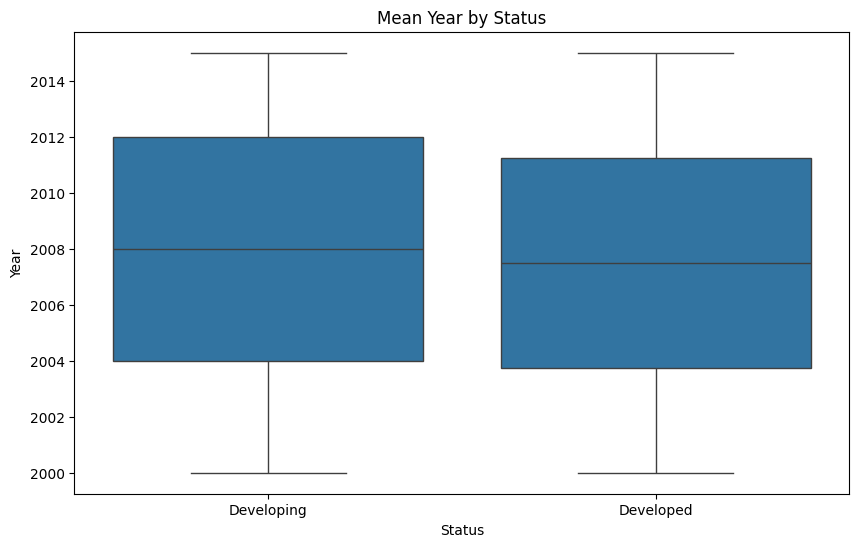

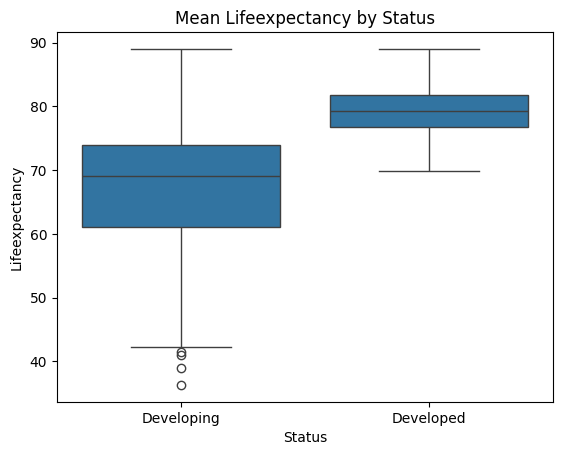

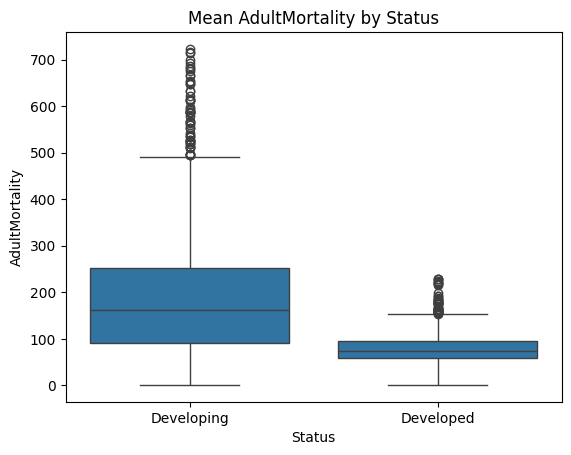

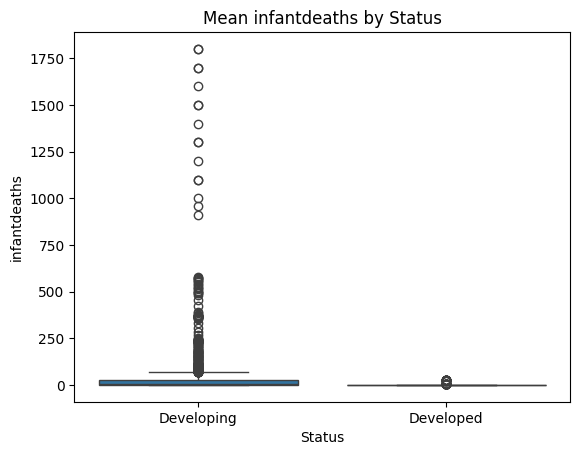

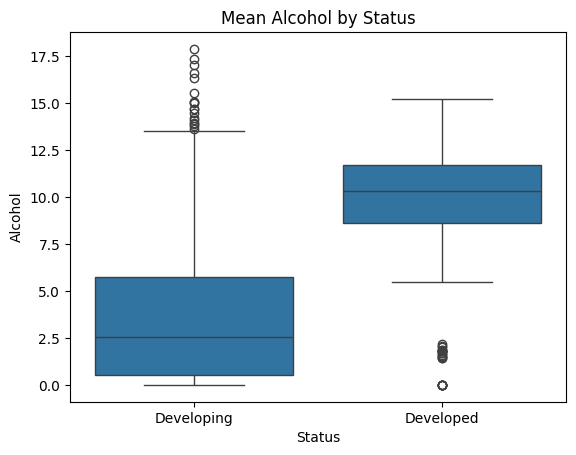

...

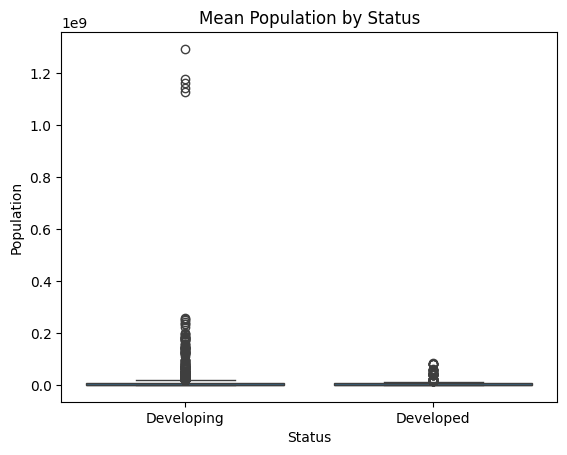

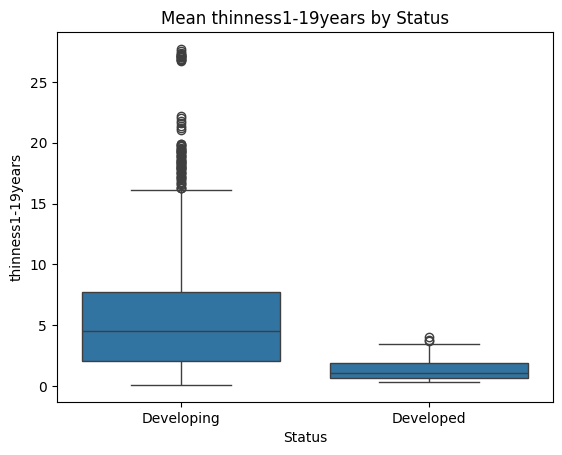

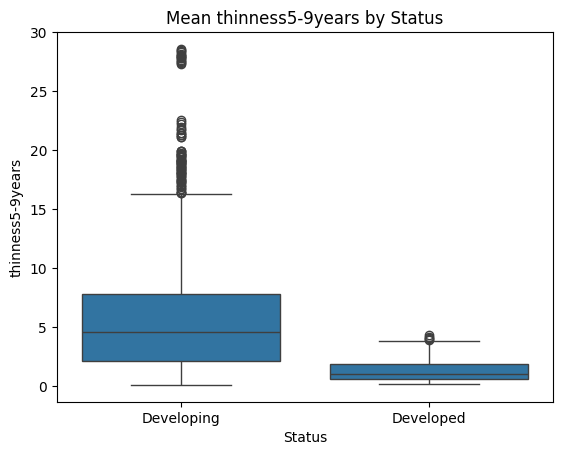

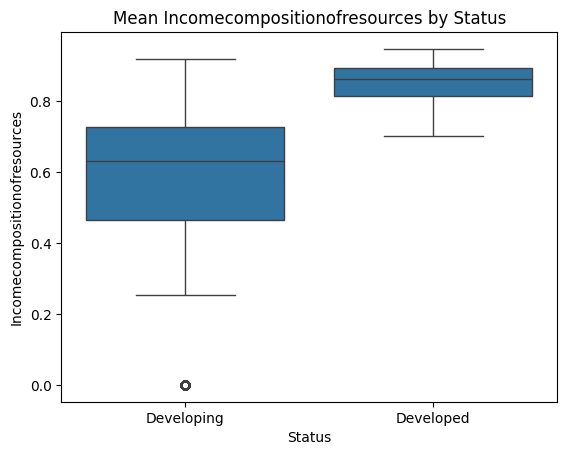

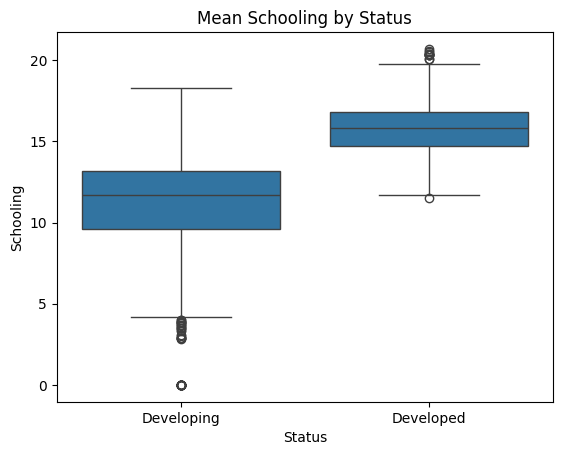

In [39]:
# Bar plot of numerical value by 'Status' for multiple numerical columns
plt.figure(figsize=(10, 6))

for col in num_cols:
    sns.boxplot(x='Status', y=col, data=df)
    plt.title(f'Mean {col} by Status')
    plt.show()



### For more EDA Questions:https://www.analyticsvidhya.com/blog/2021/03/interview-questions-on-exploratory-data-analysis-eda/

# Data Preprocessing

In [40]:
df1=df.copy()
df1.shape

(2938, 22)

## Remove unnecessary columns


### Columns with multicollinearity

In [41]:
df1.drop(['infantdeaths','percentageexpenditure','Polio','thinness1-19years','Incomecompositionofresources'],axis=1,inplace=True)
df1.shape

(2938, 17)

### Columns do not carry any useful information for the predictive model.


In [42]:
# Dropping the columns country and year 
# No relationship found between year and LifeExpectancy
df1.drop(['Country','Year'],axis=1,inplace=True)
df1.shape

(2938, 15)

## Handling missing values

### For the missing value treatment we can use mean, median, mode or KNNimputer. KNNImputer is a method used for imputing missing values by using the k-nearest neighbors approach.

In [43]:
df1.isnull().sum()

Status                0
Lifeexpectancy       10
AdultMortality       10
Alcohol             194
HepatitisB          553
Measles               0
BMI                  34
under-fivedeaths      0
Totalexpenditure    226
Diphtheria           19
HIV/AIDS              0
GDP                 448
Population          652
thinness5-9years     34
Schooling           163
dtype: int64

### Lifeexpectancy is the target variable. So no need of missing value treatment and outlier treatment as it may affect the model.

In [44]:
# removing rows with nullvalues in target column
#The subset parameter specifies that the operation should consider only the specified columns when dropping rows.
df1.dropna(subset=['Lifeexpectancy'],inplace=True) 
df1.shape

(2928, 15)

In [45]:
df1.isnull().sum()

Status                0
Lifeexpectancy        0
AdultMortality        0
Alcohol             193
HepatitisB          553
Measles               0
BMI                  32
under-fivedeaths      0
Totalexpenditure    226
Diphtheria           19
HIV/AIDS              0
GDP                 443
Population          644
thinness5-9years     32
Schooling           160
dtype: int64

In [46]:
# Filling null values with mean (Alcohol and BMI doesnot contain outliers)
for i in ['Alcohol','BMI']:
    df1[i].fillna(df1[i].mean(),inplace=True)

In [47]:
df1.isnull().sum()

Status                0
Lifeexpectancy        0
AdultMortality        0
Alcohol               0
HepatitisB          553
Measles               0
BMI                   0
under-fivedeaths      0
Totalexpenditure    226
Diphtheria           19
HIV/AIDS              0
GDP                 443
Population          644
thinness5-9years     32
Schooling           160
dtype: int64

In [48]:
# use KNNImputer to fill rest of the not null values 
#By default, it uses 5 nearest neighbors
from sklearn.impute import KNNImputer
impute=KNNImputer()

In [49]:
for i in df1.select_dtypes(include="number").columns:
    df1[i]=impute.fit_transform(df1[[i]])

In [50]:
df1.isnull().sum()

Status              0
Lifeexpectancy      0
AdultMortality      0
Alcohol             0
HepatitisB          0
Measles             0
BMI                 0
under-fivedeaths    0
Totalexpenditure    0
Diphtheria          0
HIV/AIDS            0
GDP                 0
Population          0
thinness5-9years    0
Schooling           0
dtype: int64

## Handling Outliers

### Here IQR method is used for outlier treatment

In [51]:
def whisker(col):
    q1,q3=np.percentile(col,[25,75])
    iqr=q3-q1
    lw=q1-1.5*iqr
    uw=q3+1.5*iqr
    return lw,uw

In [52]:
import numpy as np
whisker(df1['BMI'])

(-35.650000000000006, 111.15)

In [53]:
for i in df1.select_dtypes(include="number").columns:
    lw,uw=whisker(df1[i])
    df1[i]=np.where(df1[i]<lw,lw,df1[i])
    df1[i]=np.where(df1[i]>uw,uw,df1[i]) 

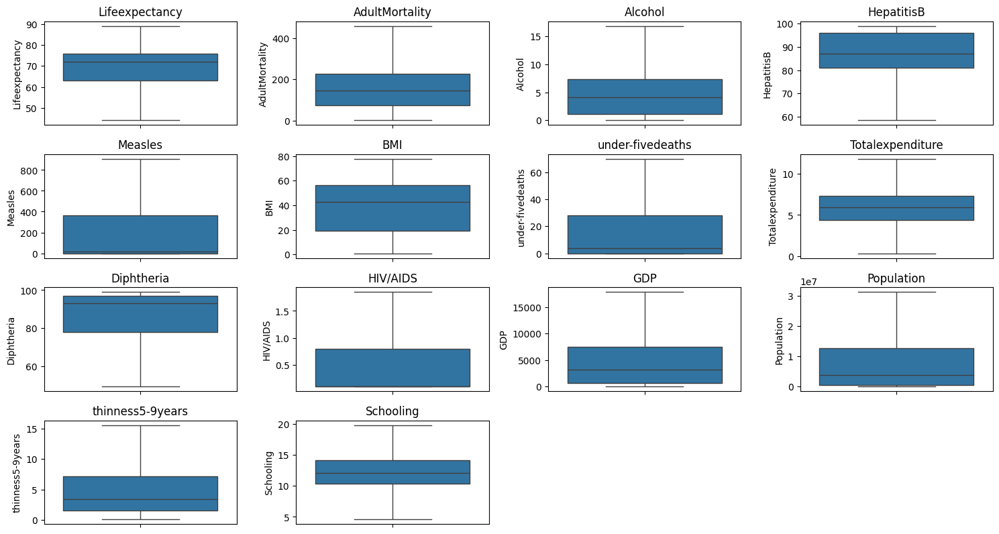

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns
#box plot to identify outliers
plt.figure(figsize=(15, 10))
numeric_columns = df1.select_dtypes(include='number').columns
for i, col in enumerate(numeric_columns):
    plt.subplot(5, 4, i+1)
    sns.boxplot(y=df1[col])
    plt.title(col)
plt.tight_layout()
plt.show()

#### All the outliers are removed.

#### Check the skewness and kurtosis after outlier treatment

In [55]:
from scipy.stats import skew, kurtosis
# Calculate skewness and kurtosis
skewness = df1[numeric_columns].apply(skew)
kurt = df1[numeric_columns].apply(lambda x: kurtosis(x, fisher=False))

print(skewness)
print(kurt)

# Identify positive and negative skewness (absolute value > 1)
positive_skewness = skewness[skewness > 1]
negative_skewness = skewness[skewness < -1]

print('Variables with positive skewness (skew > 1):\n', positive_skewness)
print('Variables with negative skewness (skew < -1):\n', negative_skewness)

# Identify platykurtic (kurtosis < 3) and leptokurtic (kurtosis > 3) distributions
platykurtic = kurt[kurt < 3]
leptokurtic = kurt[kurt > 3]

print('Variables with platykurtic distribution (kurtosis < 3):\n', platykurtic)
print('Variables with leptokurtic distribution (kurtosis > 3):\n', leptokurtic)

Lifeexpectancy     -0.623908
AdultMortality      0.776844
Alcohol             0.604084
HepatitisB         -0.817210
Measles             1.181372
BMI                -0.231709
under-fivedeaths    1.233902
Totalexpenditure    0.264356
Diphtheria         -1.246443
HIV/AIDS            1.203524
GDP                 1.181514
Population          1.292416
thinness5-9years    1.092643
Schooling          -0.300385
dtype: float64
Lifeexpectancy      2.709194
AdultMortality      3.001300
Alcohol             2.335268
HepatitisB          2.606520
Measles             2.598449
BMI                 1.705799
under-fivedeaths    2.905943
Totalexpenditure    2.954711
Diphtheria          3.270428
HIV/AIDS            2.625506
GDP                 3.287045
Population          3.992551
thinness5-9years    3.540679
Schooling           2.973390
dtype: float64
Variables with positive skewness (skew > 1):
 Measles             1.181372
under-fivedeaths    1.233902
HIV/AIDS            1.203524
GDP                 1.181

# Expected Questions

### 1. What is data preprocessing, and why is it important?
 Data preprocessing is the process of transforming raw data into a clean and usable format. This step involves tasks such as data cleaning, normalization, transformation, feature extraction, and feature selection. It is crucial because raw data often contains noise, missing values, and inconsistencies that can negatively impact the performance of machine learning models. Effective preprocessing can lead to more accurate and reliable models.

### 2. What techniques can be used to handle missing data?
- Removal: Delete rows or columns with missing values, though this can lead to loss of valuable information.
- Imputation: Replace missing values with mean, median, mode, or a specific value.
- Interpolation: Use interpolation techniques to estimate missing values.
- Predictive Modeling: Use algorithms to predict missing values based on other features.
- K-Nearest Neighbors (KNN) Imputation: Use the values from the nearest neighbors to fill in missing data.

### 3. What is the difference between normalization and standardization?
- Normalization: Scaling the data to a fixed range, usually [0, 1]. This is useful when the data has different units or scales.
- Standardization: Scaling the data to have a mean of 0 and a standard deviation of 1. This is useful when the data follows a normal distribution.)
)


In [56]:
# Normalization
# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()
# normalized_data = scaler.fit_transform(data)

# Standardization
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()
# standardized_data = scaler.fit_transform(data)

### 4. How do you handle categorical data?
- Label Encoding: Convert categories to numeric labels.
- One-Hot Encoding: Create binary columns for each category.

In [57]:
#  Label Encoding
# from sklearn.preprocessing import LabelEncoder
# le = LabelEncoder()
# df['category'] = le.fit_transform(df['category'])

# One-Hot Encoding
# from sklearn.preprocessing import OneHotEncoder
# ohe = OneHotEncoder()
# transformed_data = ohe.fit_transform(df[['category']])

### 5. What is feature scaling, and why is it necessary?
Feature scaling is the process of adjusting the range of features in your data. It is necessary because many machine learning algorithms perform better or converge faster when features are on a similar scale. For instance, algorithms like k-nearest neighbors (KNN) and gradient descent optimization-based algorithms are sensitive to the scale of the data.

### 6. What is the purpose of data augmentation, and in which scenarios is it used?
Data augmentation involves creating new data samples by applying transformations to the existing data. It is commonly used in image processing tasks to increase the diversity of the training data without collecting new data, thereby helping to reduce overfitting. Techniques include rotations, translations, flipping, and adding noise.

### 7. How do you detect and handle outliers in a dataset?

Detection:
- Visualization: Box plots
- Statistical Methods: Z-score, IQR (Interquartile Range)
 
Handling:
- Removal: Delete outlier rows.
- Capping/Flooring: Set extreme values to a specified percentile.
- Imputation: Replace outliers with mean/median values or other appropriate methods.

In [58]:
# import numpy as np
# from scipy import stats
# z_scores = np.abs(stats.zscore(data))
# outliers = np.where(z_scores > 3)

### How do you handle imbalanced datasets?

Resampling Techniques:
- Undersampling: Randomly remove samples from the majority class to balance the class distribution.
- Oversampling: Increase the number of samples in the minority class by replicating existing samples or generating synthetic samples.

Algorithmic Techniques:
- Class weights: Assign higher weights to minority class samples during training to penalize misclassifications in the minority class more.
- Algorithm selection: Choose algorithms that inherently handle class imbalance well, such as tree-based algorithms like Random Forest or gradient boosting.

Generate Synthetic Samples:
- Techniques like Synthetic Minority Over-sampling Technique (SMOTE) generate synthetic samples for the minority class, improving its representation in the dataset.

# Visualization

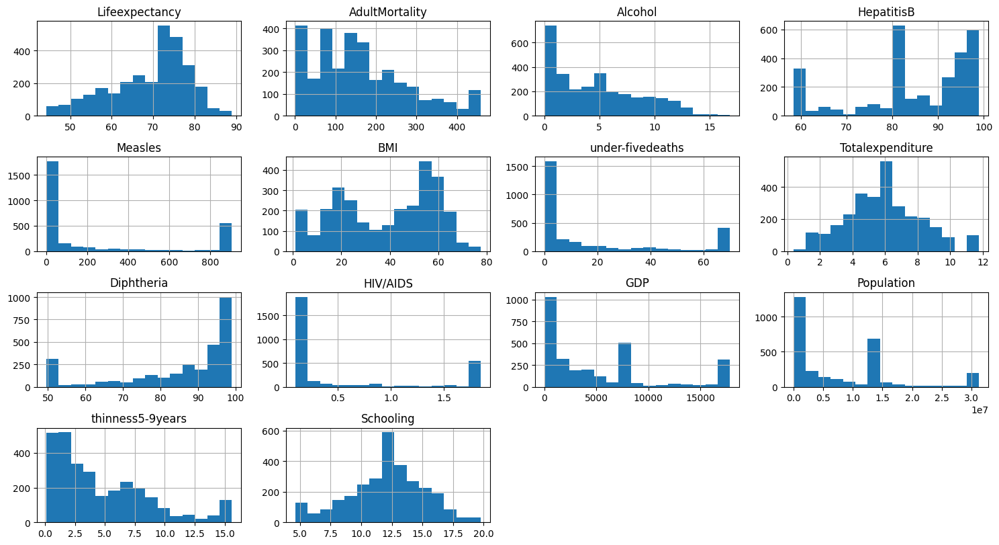

In [59]:
# Histograms for numerical columns after outlier treatment
df1[numeric_columns].hist(bins=15, figsize=(15, 10), layout=(5, 4))
plt.tight_layout()
plt.show()

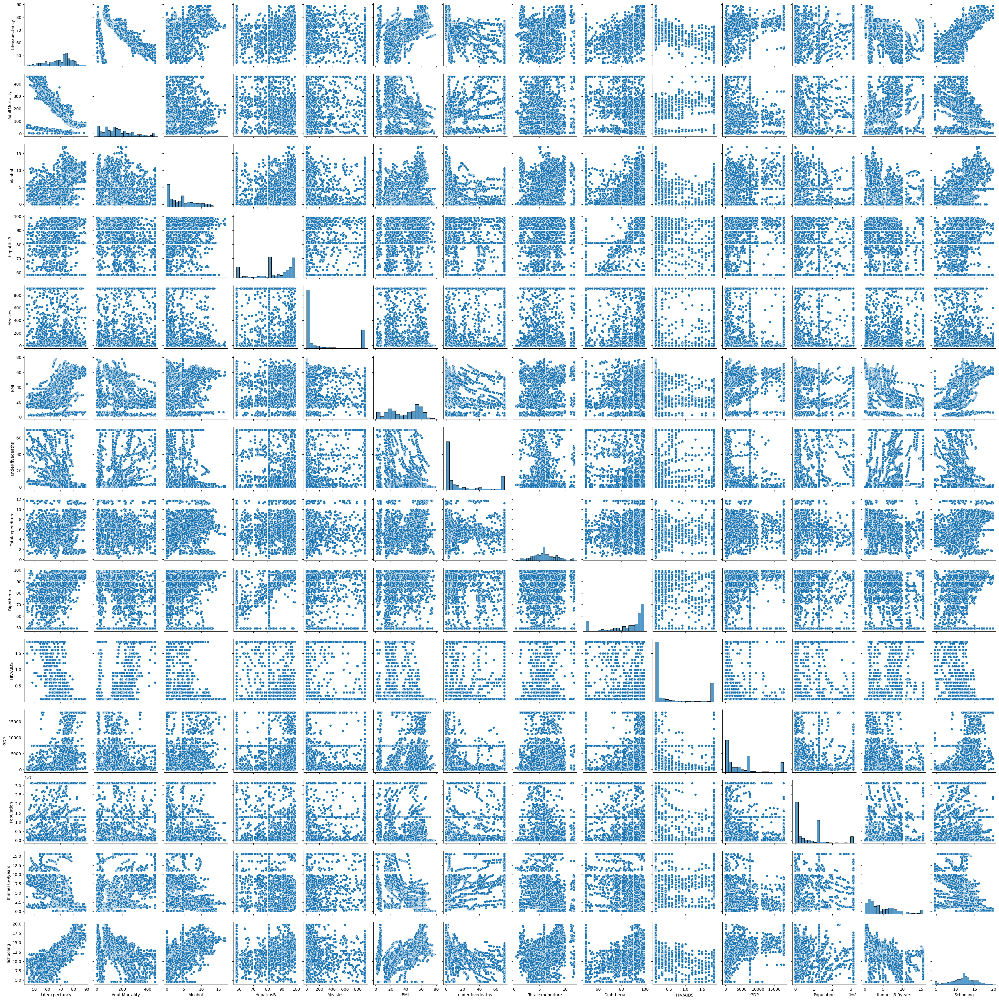

In [60]:
#Pair plot - To visualize relationships between multiple pairs of variables.
sns.pairplot(df1)

<Axes: xlabel='count', ylabel='Status'>

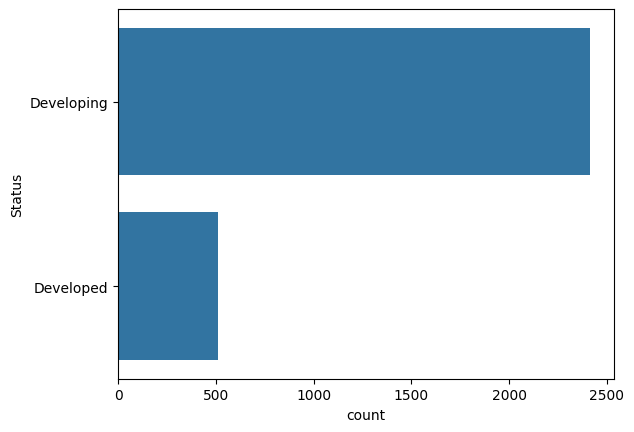

In [61]:
sns.countplot(df1['Status'])

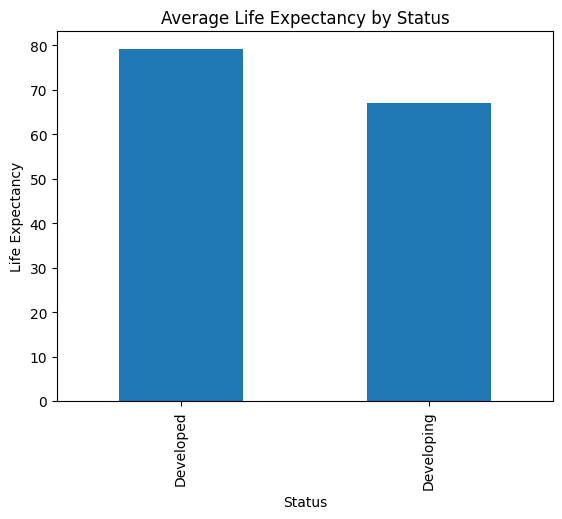

In [62]:
# Barplot - Compare average Lifeexpectancy for different Status.
df1.groupby('Status')['Lifeexpectancy'].mean().plot(kind='bar')
plt.title('Average Life Expectancy by Status')
plt.ylabel('Life Expectancy')
plt.show()

#### Average Life Expectancy is high on Developed countries than Develping countries

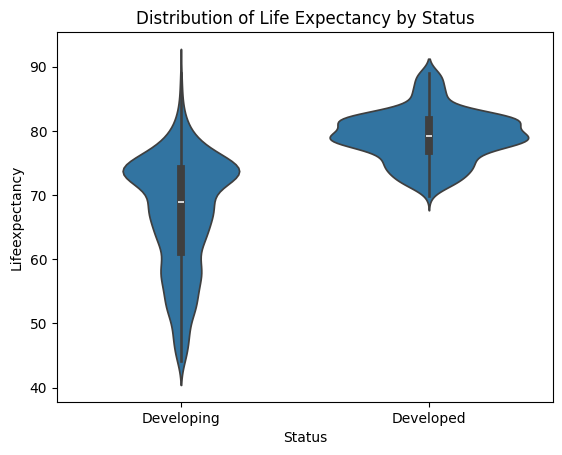

In [63]:
# violinplot - Visualize the distribution of Lifeexpectancy by Status.
sns.violinplot(data=df1, x='Status', y='Lifeexpectancy')
plt.title('Distribution of Life Expectancy by Status')
plt.show()

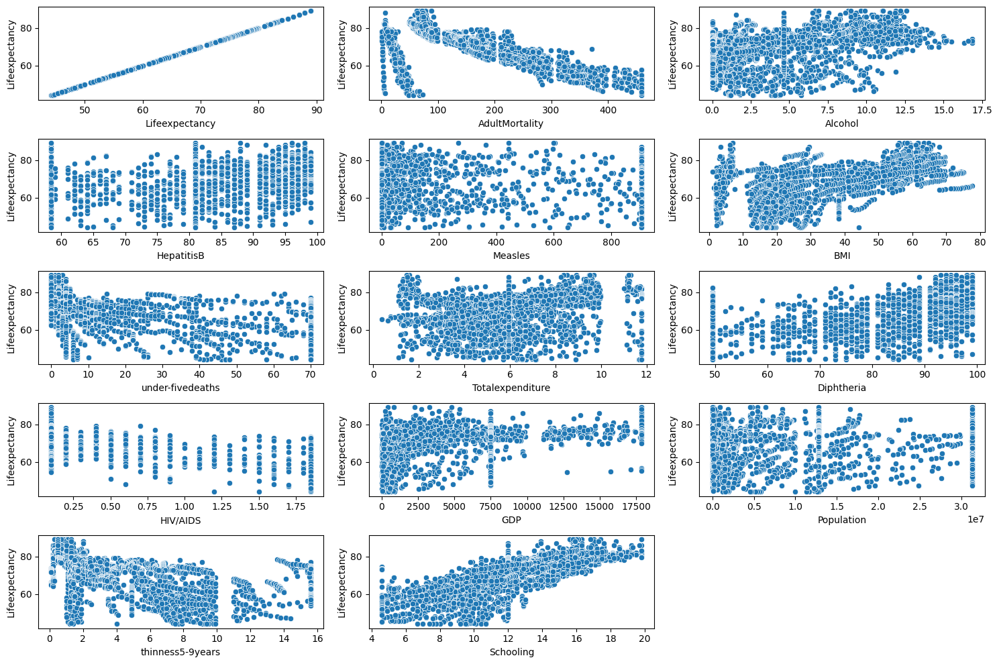

In [64]:
# scatter plot to identify the relationship between dependent (Life expectancy) and independent features
plt.figure(figsize=(15, 10))
for i, col in enumerate(numeric_columns):
    plt.subplot(5, 3, i+1)
    sns.scatterplot(data=df1,x=col,y='Lifeexpectancy')
    plt.xlabel(col)
plt.tight_layout()
plt.show()

<Axes: >

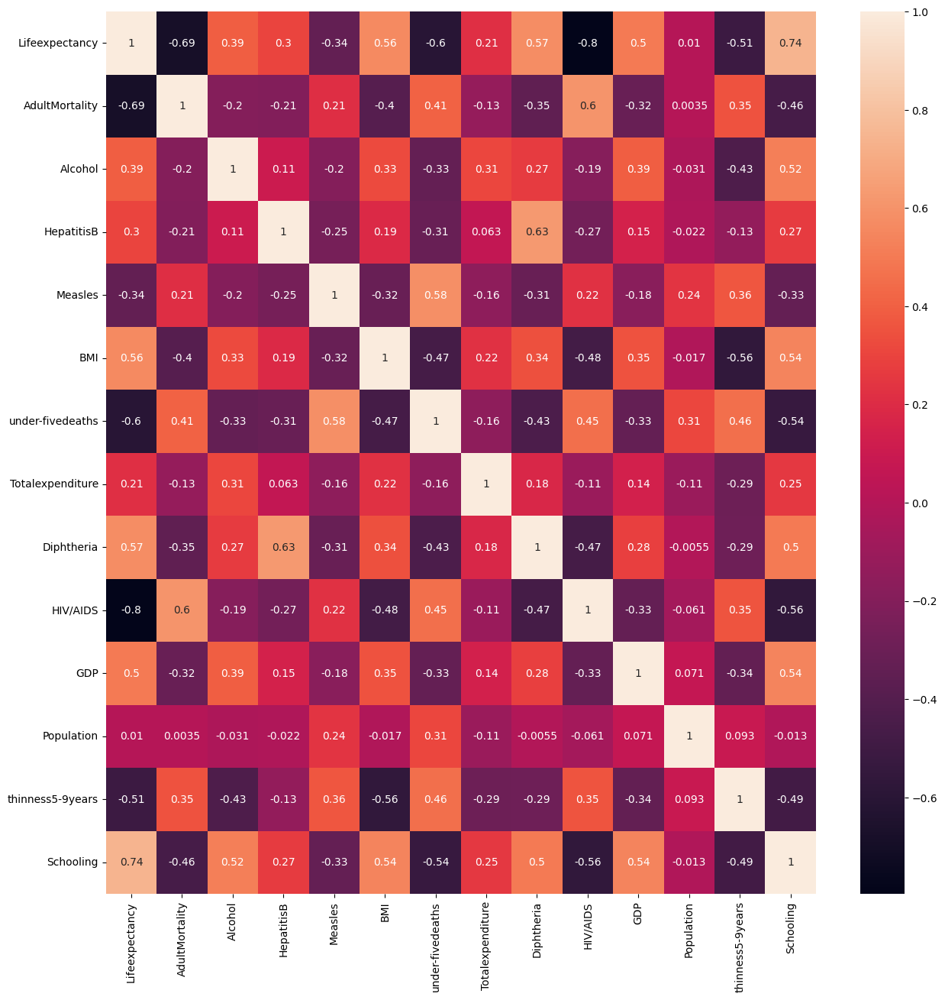

In [65]:
plt.figure(figsize=(15,15))
sns.heatmap(df1[numeric_columns].corr(),annot=True)

## Expected Questions

### 1.Why is data visualization important in machine learning?

Data visualization is important in machine learning because it allows us to explore complex datasets, identify patterns, relationships, and outliers, and communicate insights effectively to stakeholders. It helps in understanding the data distribution, feature relationships, and model performance, leading to better decision-making throughout the machine learning pipeline.

### 2. What are some common types of plots used in data visualization for machine learning?

Common types of plots used in data visualization for machine learning include scatter plots, histograms, box plots, line plots, heatmaps, bar charts, pie charts, and area plots. Each plot type serves different purposes, such as exploring relationships between variables, visualizing distributions, or comparing categories.

### 3.How do you choose the appropriate visualization for a given dataset?

The choice of visualization depends on the data characteristics and the insights we want to gain. For example, we use scatter plots to visualize relationships between continuous variables, histograms to visualize distributions, and bar charts to compare categories. Understanding the data and the questions we want to answer guides the selection of the most appropriate visualization technique.

### 4.Can you explain the concept of dimensionality reduction and how it is visualized?

Dimensionality reduction techniques like Principal Component Analysis (PCA) or t-distributed Stochastic Neighbor Embedding (t-SNE) are used to reduce the dimensionality of high-dimensional data while preserving important relationships. These reduced dimensions can then be visualized in 2D or 3D plots to explore clusters, patterns, or similarities among data points.

### 5.How do you visualize model performance and evaluation metrics?

Model performance and evaluation metrics can be visualized using various plots such as ROC curves, precision-recall curves, confusion matrices, and learning curves. These visualizations provide insights into the model's classification performance, trade-offs between precision and recall, and how the model performs with different training dataset sizes.

# Feature Engineering

### Encode categorical features to numerical using techniques like one-hot encoding or label encoding to prepare the data for machine learning algorithms. Use Label encoding for ordinal data and one-hot encoding for nominal data.


In [66]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2928 entries, 0 to 2937
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Status            2928 non-null   object 
 1   Lifeexpectancy    2928 non-null   float64
 2   AdultMortality    2928 non-null   float64
 3   Alcohol           2928 non-null   float64
 4   HepatitisB        2928 non-null   float64
 5   Measles           2928 non-null   float64
 6   BMI               2928 non-null   float64
 7   under-fivedeaths  2928 non-null   float64
 8   Totalexpenditure  2928 non-null   float64
 9   Diphtheria        2928 non-null   float64
 10  HIV/AIDS          2928 non-null   float64
 11  GDP               2928 non-null   float64
 12  Population        2928 non-null   float64
 13  thinness5-9years  2928 non-null   float64
 14  Schooling         2928 non-null   float64
dtypes: float64(14), object(1)
memory usage: 366.0+ KB


In [67]:
# Perform one-hot encoding on the 'Status' column 
#drop_first=True: This parameter is set to True to drop the first level for each categorical variable after one-hot encoding. This is done to prevent multicollinearity 
df1 = pd.get_dummies(df1, columns=['Status'], drop_first=True)

In [68]:
df1.head()

,Lifeexpectancy,AdultMortality,Alcohol,HepatitisB,Measles,BMI,under-fivedeaths,Totalexpenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness5-9years,Schooling,Status_Developing
0,65.0,263.0,0.01,65.0,905.625,19.1,70.0,8.16,65.0,0.1,584.259210,3.128417e+07,15.6,10.1,True
1,59.9,271.0,0.01,62.0,492.000,18.6,70.0,8.18,62.0,0.1,612.696514,3.275820e+05,15.6,10.0,True
2,59.9,268.0,0.01,64.0,430.000,18.1,70.0,8.13,64.0,0.1,631.744976,3.128417e+07,15.6,9.9,True
3,59.5,272.0,0.01,67.0,905.625,17.6,70.0,8.52,67.0,0.1,669.959000,3.696958e+06,15.6,9.8,True
4,59.2,275.0,0.01,68.0,905.625,17.2,70.0,7.87,68.0,0.1,63.537231,2.978599e+06,15.6,9.5,True


In [69]:
X=df1.drop('Lifeexpectancy',axis=1)
y=df1[['Lifeexpectancy']]

In [70]:
X.head()

,AdultMortality,Alcohol,HepatitisB,Measles,BMI,under-fivedeaths,Totalexpenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness5-9years,Schooling,Status_Developing
0,263.0,0.01,65.0,905.625,19.1,70.0,8.16,65.0,0.1,584.259210,3.128417e+07,15.6,10.1,True
1,271.0,0.01,62.0,492.000,18.6,70.0,8.18,62.0,0.1,612.696514,3.275820e+05,15.6,10.0,True
2,268.0,0.01,64.0,430.000,18.1,70.0,8.13,64.0,0.1,631.744976,3.128417e+07,15.6,9.9,True
3,272.0,0.01,67.0,905.625,17.6,70.0,8.52,67.0,0.1,669.959000,3.696958e+06,15.6,9.8,True
4,275.0,0.01,68.0,905.625,17.2,70.0,7.87,68.0,0.1,63.537231,2.978599e+06,15.6,9.5,True


In [71]:
X.shape

(2928, 14)

In [72]:
y.shape

(2928, 1)

### Scale numerical features to ensure that they have the same magnitude, preventing some features from dominating others during model training.


In [73]:
# Scaling using StandardScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

# Convert the result back to a DataFrame
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

X_scaled

,AdultMortality,Alcohol,HepatitisB,Measles,BMI,under-fivedeaths,Totalexpenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness5-9years,Schooling,Status_Developing
0,0.871086,-1.176836,-1.537612,1.884396,-0.964155,2.061485,0.988621,-1.282015,-0.630709,-0.813774,2.649184,2.734294,-0.628647,0.460348
1,0.940142,-1.176836,-1.772450,0.721332,-0.989348,2.061485,0.997369,-1.472166,-0.630709,-0.808705,-0.824808,2.734294,-0.660924,0.460348
2,0.914246,-1.176836,-1.615891,0.546996,-1.014541,2.061485,0.975498,-1.345399,-0.630709,-0.805310,2.649184,2.734294,-0.693201,0.460348
3,0.948774,-1.176836,-1.381053,1.884396,-1.039734,2.061485,1.146095,-1.155248,-0.630709,-0.798499,-0.446692,2.734294,-0.725478,0.460348
4,0.974671,-1.176836,-1.302774,1.884396,-1.059889,2.061485,0.861767,-1.091864,-0.630709,-0.906585,-0.527307,2.734294,-0.822309,0.460348
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2923,2.562974,-0.064996,-1.302774,-0.574943,-0.561068,0.950871,0.538069,-1.282015,1.890947,-0.836925,0.572341,1.174035,-0.919141,0.460348
2924,2.562974,-0.141674,-2.054090,1.884396,-0.581222,0.911206,0.271238,-1.091864,1.890947,-0.837106,0.556224,1.299862,-0.822309,0.460348
2925,-0.769010,-0.047104,-0.911377,0.192699,-0.601376,0.871542,0.275612,-0.901714,1.890947,-0.907688,-0.847483,-0.864367,-0.660924,0.460348
2926,2.562974,-0.739767,-0.676539,0.825372,-0.621531,0.831877,0.113763,-0.648179,1.890947,-0.820132,0.526179,-0.763705,-0.725478,0.460348


#  Data Splitting

In [74]:
#Splitting the dataset into 80-20, that is, 80% of the data is for training and 20% of the data is for testing.
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Model Selection

### Models Selected: LinearRegression, DecisionTreeRegressor,ExtraTreeRegressor, RandomForestRegressor, GradientBoostingRegressor, SVR, MLPRegressor,  XGBRegressor

# Model Training & Evaluation (Without feature Selection & Hyperparameter Tuning)

In [75]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

model_name= []
RMSE = []
MSE = []
MAE = []
R2_score = []


models = [
    LinearRegression(),
    DecisionTreeRegressor(),
    ExtraTreeRegressor(),
    RandomForestRegressor(),
    GradientBoostingRegressor(),
    SVR(),
    MLPRegressor(),
    XGBRegressor(),
    
]

for model in models :
    model.fit(X_train , y_train)
    
    prediction = model.predict(X_test)
    
    model_name.append(model.__class__.__name__)
    
    RMSE.append(mean_squared_error(y_test, prediction, squared=False))
    MSE.append(mean_squared_error(y_test, prediction))
    MAE.append(mean_absolute_error(y_test, prediction))
    R2_score.append(r2_score(y_test, prediction) * 100)

In [76]:
models_df = pd.DataFrame({"Model-Name":model_name, "RMSE": RMSE, "MSE":MSE, "MAE":MAE, "R2_Score":R2_score})
models_df = models_df.set_index('Model-Name')
models_df.sort_values("R2_Score", ascending = False)

,RMSE,MSE,MAE,R2_Score
Model-Name,,,,
RandomForestRegressor,1.792581,3.213345,1.134754,96.276288
XGBRegressor,1.906996,3.636632,1.229950,95.785771
GradientBoostingRegressor,2.295516,5.269395,1.683496,93.893681
DecisionTreeRegressor,2.478970,6.145290,1.479522,92.878670
ExtraTreeRegressor,2.707741,7.331860,1.688908,91.503640
SVR,2.998777,8.992665,2.139653,89.579054
LinearRegression,3.651004,13.329832,2.808942,84.553026
MLPRegressor,5.322644,28.330536,4.113303,67.169800


#### RandomForestRegressor has the best performance among all listed models, indicated by the lowest RMSE, MSE, and MAE, and the highest R² score. It suggests that the Random Forest Regressor is able to capture the underlying patterns in the data very well.

#### Why the MLP Regressor Got the Least R² Score
- This could be due to an insufficient amount of training data or inappropriate network architecture
- Neural networks require careful tuning of hyperparameters (such as learning rate, batch size, number of epochs, network architecture, etc.)
- The dataset might have characteristics that are better suited to tree-based models (like RandomForestRegressor and GradientBoostingRegressor) than neural networks. For instance, tree-based models are often better at handling categorical data and capturing non-linear relationships without requiring extensive feature engineering.

# Expected Questions

### 1. What is the difference between supervised and unsupervised learning?

Supervised learning involves training a model on labeled data, where each data point is associated with a target variable or outcome. The goal is to learn a mapping from input features to the target variable.
Unsupervised learning, on the other hand, deals with unlabeled data, where the model aims to find patterns or structures in the data without explicit supervision. It's often used for tasks such as clustering, dimensionality reduction, and anomaly detection.

### 2.What are some common algorithms used in supervised learning?
Some common algorithms include linear regression, logistic regression, decision trees, support vector machines (SVM), k-nearest neighbors (KNN), and neural networks.

### 3.What is cross-validation, and why is it useful?
Cross-validation is a technique used to assess the performance and generalization ability of a machine learning model. It involves splitting the dataset into multiple subsets (folds), training the model on several combinations of these subsets, and evaluating its performance on the remaining data.
Cross-validation is useful because it provides a more robust estimate of the model's performance compared to a single train-test split. It helps detect overfitting and provides a more accurate representation of how the model will perform on unseen data.

### 4.What is overfitting, and how can it be addressed?
Overfitting occurs when a model learns the training data too well, capturing noise or irrelevant patterns that do not generalize to new data. It can be addressed by using techniques such as regularization, cross-validation, or collecting more training data.

### 5. What evaluation metrics are commonly used for classification problems?
Common evaluation metrics for classification problems include accuracy_score, precision, recall, F1-score, ROC curve, and AUC-ROC (Area Under the ROC Curve).

### 6.What is bias-variance tradeoff?
The bias-variance tradeoff refers to the balance between the bias (error due to overly simplistic assumptions in the learning algorithm) and variance (error due to sensitivity to fluctuations in the training data) of a model. A model with high bias tends to underfit the data, while a model with high variance tends to overfit the data.

### 7. What are hyperparameters, and how do you tune them?
Hyperparameters are parameters that are set before the learning process begins and control aspects of the learning process itself. Examples include the learning rate in gradient descent, the number of hidden layers in a neural network, and the regularization parameter in regression models.
Hyperparameter tuning involves selecting the optimal values for these parameters to improve the performance of the model. Techniques for hyperparameter tuning include grid search, random search, and Bayesian optimization.

### 8. What is ensemble learning, and why is it effective?
Ensemble learning combines multiple models (e.g., decision trees, neural networks) to improve predictive performance. It is effective because it can reduce overfitting, increase robustness, and capture different aspects of the data. Examples include bagging, boosting, and stacking.

### 9. How do you interpret the confusion matrix in a classification problem?
A confusion matrix is a table that summarizes the performance of a classification model by comparing predicted class labels with actual class labels. It consists of four quadrants: True Positive (TP), True Negative (TN), False Positive (FP), and False Negative (FN).
From the confusion matrix, various performance metrics can be derived, such as accuracy, precision, recall (sensitivity), specificity, and F1-score. These metrics provide insights into the model's ability to correctly classify instances of each class and its overall performance

### 10. Other than Lif expectancy what else can be predicted from this dataset?
Ex:  Adult Mortality, Infant deathss overall performance

# Feature selection
https://www.linkedin.com/pulse/exploring-feature-selection-techniques-machine-navadeep-komarraju-dctrc?utm_source=share&utm_medium=member_android&utm_campaign=share_via


## 1. SelecKBbest

In [77]:
from sklearn.feature_selection import SelectKBest, f_regression

# SelectKBest with f_regression
selector_kbest = SelectKBest(score_func=f_regression, k=10)
X_kbest = selector_kbest.fit_transform(X_train, y_train)

# Get the selected feature indices
selected_indices_kbest = selector_kbest.get_support(indices=True)

# Get the names of the selected features
selected_features_kbest = X_train.columns[selected_indices_kbest]

print("Selected features using SelectKBest:", selected_features_kbest)

Selected features using SelectKBest: Index(['AdultMortality', 'Alcohol', 'BMI', 'under-fivedeaths', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'thinness5-9years', 'Schooling',
       'Status_Developing'],
      dtype='object')


## Train the models with selected features using SelectKBest

In [78]:
X1 = X_scaled[['AdultMortality', 'Alcohol', 'BMI', 'under-fivedeaths', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'thinness5-9years', 'Schooling',
       'Status_Developing']]

X1_train, X1_test, y1_train, y1_test = train_test_split(X1,y,test_size = 0.2,random_state = 42)

model_name= []
RMSE = []
MSE = []
MAE = []
R2_score = []


models = [
    LinearRegression(),
    DecisionTreeRegressor(),
    ExtraTreeRegressor(),
    RandomForestRegressor(),
    GradientBoostingRegressor(),
    SVR(),
    MLPRegressor(),
    XGBRegressor(),
    
]

for model in models :
    model.fit(X1_train , y1_train)
    
    prediction = model.predict(X1_test)
    
    model_name.append(model.__class__.__name__)
    
    RMSE.append(mean_squared_error(y1_test, prediction, squared=False))
    MSE.append(mean_squared_error(y1_test, prediction))
    MAE.append(mean_absolute_error(y1_test, prediction))
    R2_score.append(r2_score(y1_test, prediction) * 100)

models_df = pd.DataFrame({"Model-Name":model_name, "RMSE": RMSE, "MSE":MSE, "MAE":MAE, "R2_Score":R2_score})
models_df = models_df.set_index('Model-Name')
models_df.sort_values("R2_Score", ascending = False)

,RMSE,MSE,MAE,R2_Score
Model-Name,,,,
RandomForestRegressor,1.765293,3.116258,1.106505,96.388795
XGBRegressor,1.905366,3.630418,1.255377,95.792972
GradientBoostingRegressor,2.235758,4.998613,1.626008,94.207471
DecisionTreeRegressor,2.282845,5.211382,1.385836,93.960908
ExtraTreeRegressor,2.554107,6.523464,1.524403,92.440431
SVR,2.769332,7.669201,1.906351,91.112720
LinearRegression,3.668099,13.454949,2.799393,84.408037
MLPRegressor,4.146024,17.189517,3.140619,80.080318


## 2. SelectFromModel with Lasso (L1 Regularization)

In [79]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

# Lasso model
lasso_model = Lasso(alpha=0.1)  # Adjust alpha as needed

# SelectFromModel with Lasso
selector_lasso = SelectFromModel(lasso_model, max_features=10)
X_lasso = selector_lasso.fit_transform(X_train, y_train)

# Get the selected feature indices
selected_indices_lasso = selector_lasso.get_support(indices=True)

# Print selected feature names
selected_features_lasso = X_train.columns[selected_indices_lasso]
print("Selected features using SelectFromModel with Lasso:", selected_features_lasso)

Selected features using SelectFromModel with Lasso: Index(['AdultMortality', 'HepatitisB', 'under-fivedeaths', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness5-9years', 'Schooling',
       'Status_Developing'],
      dtype='object')


### Train the models with selected features using L1 Regularization

In [80]:
X2 = X_scaled[['AdultMortality', 'HepatitisB', 'under-fivedeaths', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness5-9years', 'Schooling',
       'Status_Developing']]

X2_train, X2_test, y2_train, y2_test = train_test_split(X2,y,test_size = 0.2,random_state = 42)

model_name= []
RMSE = []
MSE = []
MAE = []
R2_score = []


models = [
    LinearRegression(),
    DecisionTreeRegressor(),
    ExtraTreeRegressor(),
    RandomForestRegressor(),
    GradientBoostingRegressor(),
    SVR(),
    MLPRegressor(),
    XGBRegressor(),
    
]

for model in models :
    model.fit(X2_train , y2_train)
    
    prediction = model.predict(X2_test)
    
    model_name.append(model.__class__.__name__)
    
    RMSE.append(mean_squared_error(y2_test, prediction, squared=False))
    MSE.append(mean_squared_error(y2_test, prediction))
    MAE.append(mean_absolute_error(y2_test, prediction))
    R2_score.append(r2_score(y2_test, prediction) * 100)

models_df = pd.DataFrame({"Model-Name":model_name, "RMSE": RMSE, "MSE":MSE, "MAE":MAE, "R2_Score":R2_score})
models_df = models_df.set_index('Model-Name')
models_df.sort_values("R2_Score", ascending = False)

,RMSE,MSE,MAE,R2_Score
Model-Name,,,,
RandomForestRegressor,1.830129,3.349372,1.150592,96.118656
XGBRegressor,1.908557,3.642589,1.239593,95.778868
GradientBoostingRegressor,2.292658,5.256281,1.687737,93.908878
DecisionTreeRegressor,2.445121,5.978618,1.439420,93.071814
SVR,2.925633,8.559331,2.067664,90.081213
ExtraTreeRegressor,2.938935,8.637338,1.754608,89.990816
LinearRegression,3.654647,13.356447,2.809823,84.522184
MLPRegressor,4.981053,24.810886,3.787822,71.248466


## 3. Recursive Feature Elimination (RFE) with Random Forest Regressor

In [81]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor

# Random Forest regressor
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# RFE with Random Forest regressor
rfe_selector_regressor = RFE(estimator=rf_regressor, n_features_to_select=10, step=1)
X_rfe_regressor = rfe_selector_regressor.fit_transform(X_train, y_train)

# Get the selected feature indices
selected_indices_rfe_regressor = rfe_selector_regressor.get_support(indices=True)

# Get the names of the selected features
selected_features_rfe_regressor = X_train.columns[selected_indices_rfe_regressor]

print("Selected features using RFE with Random Forest Regressor:", selected_features_rfe_regressor)

Selected features using RFE with Random Forest Regressor: Index(['AdultMortality', 'Alcohol', 'BMI', 'under-fivedeaths',
       'Totalexpenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'thinness5-9years',
       'Schooling'],
      dtype='object')


### Train the models with selected features using Recursive Feature Elimination (RFE)

In [82]:
X3 = X_scaled[['AdultMortality', 'Alcohol', 'BMI', 'under-fivedeaths',
       'Totalexpenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'thinness5-9years',
       'Schooling']]

X3_train, X3_test, y3_train, y3_test = train_test_split(X3,y,test_size = 0.2,random_state = 42)

model_name= []
RMSE = []
MSE = []
MAE = []
R2_score = []


models = [
    LinearRegression(),
    DecisionTreeRegressor(),
    ExtraTreeRegressor(),
    RandomForestRegressor(),
    GradientBoostingRegressor(),
    SVR(),
    MLPRegressor(),
    XGBRegressor(),
    
]

for model in models :
    model.fit(X3_train , y3_train)
    
    prediction = model.predict(X3_test)
    
    model_name.append(model.__class__.__name__)
    
    RMSE.append(mean_squared_error(y3_test, prediction, squared=False))
    MSE.append(mean_squared_error(y3_test, prediction))
    MAE.append(mean_absolute_error(y3_test, prediction))
    R2_score.append(r2_score(y3_test, prediction) * 100)

models_df = pd.DataFrame({"Model-Name":model_name, "RMSE": RMSE, "MSE":MSE, "MAE":MAE, "R2_Score":R2_score})
models_df = models_df.set_index('Model-Name')
models_df.sort_values("R2_Score", ascending = False)

,RMSE,MSE,MAE,R2_Score
Model-Name,,,,
RandomForestRegressor,1.784354,3.183918,1.110642,96.310388
XGBRegressor,1.841355,3.390589,1.210688,96.070892
GradientBoostingRegressor,2.305990,5.317591,1.661320,93.837830
DecisionTreeRegressor,2.360406,5.571519,1.417918,93.543572
ExtraTreeRegressor,2.681029,7.187918,1.503072,91.670444
SVR,2.836091,8.043413,1.954099,90.679072
LinearRegression,3.723627,13.865402,2.845628,83.932393
MLPRegressor,4.569739,20.882515,3.419705,75.800770


## 4. Feature selection using Variance Threshold

In [83]:
from sklearn.feature_selection import VarianceThreshold

# Variance Threshold
variance_selector = VarianceThreshold(threshold=0.1)  # Adjust threshold as needed
X_variance = variance_selector.fit_transform(X_train)

# Get the selected feature indices
selected_indices_variance = [i for i, keep in enumerate(variance_selector.get_support()) if keep]

# Print selected feature names
selected_features_variance = X_train.iloc[:, selected_indices_variance].columns.tolist()
print("Selected features using Variance Threshold:", selected_features_variance)

Selected features using Variance Threshold: ['AdultMortality', 'Alcohol', 'HepatitisB', 'Measles', 'BMI', 'under-fivedeaths', 'Totalexpenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness5-9years', 'Schooling', 'Status_Developing']


### Train the models with selected features using Variance Threshold

In [84]:
X4 = X_scaled[['AdultMortality', 'Alcohol', 'HepatitisB', 'Measles', 'BMI', 'under-fivedeaths', 'Totalexpenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness5-9years', 'Schooling', 'Status_Developing']]

X4_train, X4_test, y4_train, y4_test = train_test_split(X4,y,test_size = 0.2,random_state = 42)

model_name= []
RMSE = []
MSE = []
MAE = []
R2_score = []


models = [
    LinearRegression(),
    DecisionTreeRegressor(),
    ExtraTreeRegressor(),
    RandomForestRegressor(),
    GradientBoostingRegressor(),
    SVR(),
    MLPRegressor(),
    XGBRegressor(),
    
]

for model in models :
    model.fit(X4_train , y4_train)
    
    prediction = model.predict(X4_test)
    
    model_name.append(model.__class__.__name__)
    
    RMSE.append(mean_squared_error(y4_test, prediction, squared=False))
    MSE.append(mean_squared_error(y4_test, prediction))
    MAE.append(mean_absolute_error(y4_test, prediction))
    R2_score.append(r2_score(y4_test, prediction) * 100)

models_df = pd.DataFrame({"Model-Name":model_name, "RMSE": RMSE, "MSE":MSE, "MAE":MAE, "R2_Score":R2_score})
models_df = models_df.set_index('Model-Name')
models_df.sort_values("R2_Score", ascending = False)

,RMSE,MSE,MAE,R2_Score
Model-Name,,,,
RandomForestRegressor,1.784674,3.185060,1.125152,96.309065
XGBRegressor,1.906996,3.636632,1.229950,95.785771
GradientBoostingRegressor,2.296769,5.275146,1.684793,93.887016
DecisionTreeRegressor,2.508814,6.294147,1.488567,92.706170
ExtraTreeRegressor,2.885355,8.325273,1.663652,90.352446
SVR,2.998777,8.992665,2.139653,89.579054
LinearRegression,3.651004,13.329832,2.808942,84.553026
MLPRegressor,5.042261,25.424393,3.917275,70.537518


### Finding the feature importance using Random forest

In [86]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train , y_train)
# Extract feature importances
feature_importances = rf.feature_importances_
# Sort feature importances in descending order
sorted_indices = feature_importances.argsort()[::-1]
# Print feature importances
print("Feature Importances:")
for idx in sorted_indices:
    print(f"{X.columns[idx]}: {feature_importances[idx]}")


Feature Importances:
HIV/AIDS: 0.5838197733763042
AdultMortality: 0.21525262626592764
Schooling: 0.07523015265564711
BMI: 0.02775884312650797
thinness5-9years: 0.0276020843077275
under-fivedeaths: 0.020760345456638737
Alcohol: 0.01131741279028537
Status_Developing: 0.007964426562485406
Totalexpenditure: 0.0064728464718503305
GDP: 0.006084524176176437
Diphtheria: 0.006001133013420517
Population: 0.004355042210338371
Measles: 0.0037868467611821364
HepatitisB: 0.003593942825508404


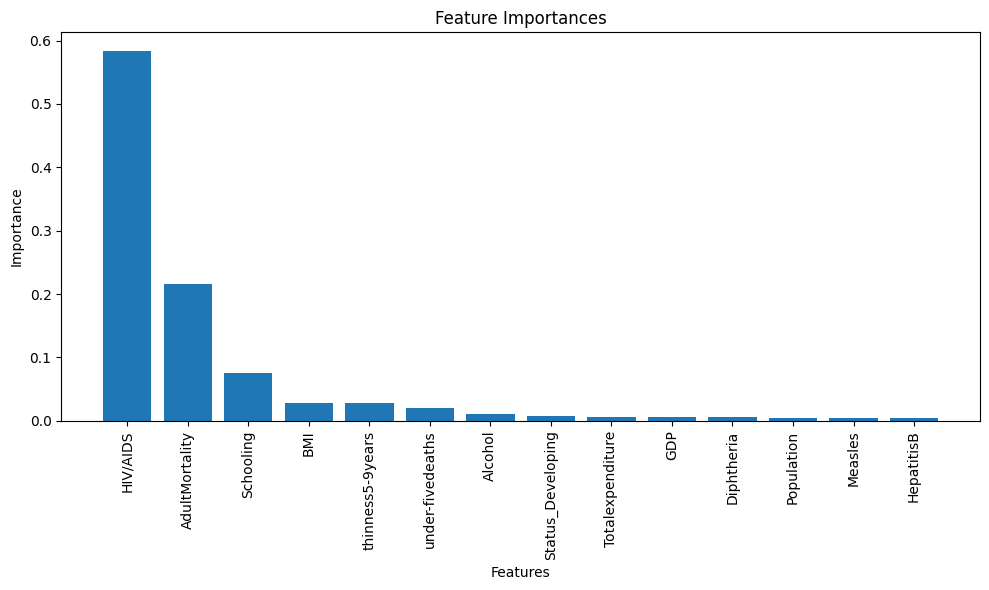

In [87]:
import matplotlib.pyplot as plt

# Sort feature importances in descending order
sorted_indices = feature_importances.argsort()[::-1]
sorted_features = [X.columns[idx] for idx in sorted_indices]
sorted_importances = [feature_importances[idx] for idx in sorted_indices]

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(sorted_features, sorted_importances)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()


# Expected Questions

### 1. What is feature selection, and why is it important in machine learning?
Feature selection is the process of identifying and selecting a subset of relevant features (variables, predictors) from the dataset for use in model construction. It is important because it can improve model performance, reduce overfitting, and decrease computational cost.

### 2. What are the main types of feature selection methods?
The main types are:
- Filter Methods: Select features based on their statistical relationship with the output variable (e.g., correlation, chi-square test).
- Wrapper Methods: Use a predictive model to evaluate combinations of features and select the best subset (e.g., recursive feature elimination, forward selection, backward elimination).
- Embedded Methods: Perform feature selection as part of the model training process (e.g., Lasso, decision tree feature importance).

### 3. How does correlation-based feature selection work?
Correlation-based feature selection involves calculating the correlation coefficients between each feature and the target variable. Features with high correlation (either positive or negative) with the target are selected, while those with low correlation are discarded.

### 4.What is Recursive Feature Elimination (RFE)?
RFE is a wrapper method that recursively removes the least important features and builds models on the remaining features. It ranks the features based on their importance and selects the optimal subset.

### 5.How does Lasso (L1 regularization) help in feature selection?
Lasso regression adds a penalty equal to the absolute value of the magnitude of coefficients to the loss function. This penalty can shrink some coefficients to zero, effectively performing feature selection by eliminating less important features.

### Example of Feature Selection with Python (Using Scikit-Learn):

In [ ]:
# Using Filter Method (Correlation-based):
# import pandas as pd
# from sklearn.model_selection import train_test_split
# from sklearn.feature_selection import SelectKBest, f_classif
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.metrics import accuracy_score

# Load your dataset
# data = pd.read_csv('your_data.csv')
# X = data.drop(columns='target')
# y = data['target']

# # Split data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Select top k features based on ANOVA F-value
# selector = SelectKBest(score_func=f_classif, k=10)
# X_train_selected = selector.fit_transform(X_train, y_train)
# X_test_selected = selector.transform(X_test)

# # Train a model
# model = RandomForestClassifier()
# model.fit(X_train_selected, y_train)

# # Predict on the test set
# y_pred = model.predict(X_test_selected)

# # Evaluate the model
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Model Accuracy with Selected Features: {accuracy:.2f}")


In [ ]:
# Using Wrapper Method (RFE):
# from sklearn.feature_selection import RFE
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import accuracy_score

# # Load your dataset
# # data = pd.read_csv('your_data.csv')
# # X = data.drop(columns='target')
# # y = data['target']

# # Split data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Initialize the model
# model = LogisticRegression(max_iter=1000)

# # Initialize RFE with the model
# rfe = RFE(estimator=model, n_features_to_select=10, step=1)
# X_train_selected = rfe.fit_transform(X_train, y_train)
# X_test_selected = rfe.transform(X_test)

# # Train the model
# model.fit(X_train_selected, y_train)

# # Predict on the test set
# y_pred = model.predict(X_test_selected)

# # Evaluate the model
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Model Accuracy with RFE: {accuracy:.2f}")


### 6. How do you assess the effectiveness of a feature selection method?
The effectiveness of a feature selection method can be assessed by evaluating its impact on model performance metrics.

### 7. What is the difference between feature selection and dimensionality reduction?
Feature selection involves selecting a subset of the original features, while dimensionality reduction involves transforming the data into a lower-dimensional space. Techniques like PCA (Principal Component Analysis) and t-SNE are used for dimensionality reduction.

### 8. How do you handle multicollinearity in feature selection?
Multicollinearity occurs when features are highly correlated with each other. It can be handled by:
- Removing one of the correlated features.
- Using algorithms that can handle multicollinearity, like Ridge regression.
- Applying dimensionality reduction techniques like PCA.

### 9. What is the role of domain knowledge in feature selection?
Domain knowledge is crucial in feature selection as it helps to identify relevant features, avoid redundant or irrelevant features, and provide insights into the underlying relationships within the data.

### 10. What are some common univariate feature selection techniques? How do they work?
Common univariate feature selection techniques include ANOVA F-test, chi-square test, and mutual information. They evaluate the relationship between each feature and the target variable independently.

# MCQ

### 1. What is the opposite of supervised learning?
Unsupervised.

### 2. What does SVM stand for?
Support Vector Machin

### 3.What does MSE stand for?
Mean Squared Error.

### 4.What is another name for the target variable?
Dependent.

### 5. What is a measure of the model's flexibility?
Complexity.

### 6. What type of learning uses labeled data?
Supervised.

### 7. What do you call a model that has learned patterns without explicit supervision?
Unsupervised.

### 8. What is the goal of feature engineering?
Improve model performance.

### 9. What type of learning involves predicting continuous values?
Regression.

### 10. What measures the difference between predicted and actual values?
Residuals.

# Hyperparameter Tuning

In [ ]:
# from sklearn.linear_model import LinearRegression
# from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
# from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
# from sklearn.svm import SVR
# from sklearn.neural_network import MLPRegressor
# from xgboost import XGBRegressor
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# import pandas as pd

# # Define parameter grids
# param_grid = {
#     'LinearRegression': {
#         'fit_intercept': [True, False],
        
#     },
#     'DecisionTreeRegressor': {
#         'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
#         'splitter': ['best', 'random'],
#         'max_depth': [None, 10, 20, 30, 40, 50],
#         'min_samples_split': [2, 10, 20],
#         'min_samples_leaf': [1, 5, 10],
#         'max_features': [None, 'auto', 'sqrt', 'log2']
#     },
#     'ExtraTreeRegressor': {
#         'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
#         'splitter': ['best', 'random'],
#         'max_depth': [None, 10, 20, 30, 40, 50],
#         'min_samples_split': [2, 10, 20],
#         'min_samples_leaf': [1, 5, 10],
#         'max_features': [None, 'auto', 'sqrt', 'log2']
#     },
#     'RandomForestRegressor': {
#         'n_estimators': [100, 200, 300, 400, 500],
#         'criterion': ['squared_error', 'absolute_error', 'poisson'],
#         'max_depth': [None, 10, 20, 30, 40, 50],
#         'min_samples_split': [2, 10, 20],
#         'min_samples_leaf': [1, 5, 10],
#         'max_features': ['auto', 'sqrt', 'log2']
#     },
#     'GradientBoostingRegressor': {
#         'loss': ['squared_error', 'absolute_error', 'huber', 'quantile'],
#         'learning_rate': [0.01, 0.05, 0.1, 0.2],
#         'n_estimators': [100, 200, 300, 400, 500],
#         'subsample': [0.6, 0.8, 1.0],
#         'criterion': ['squared_error', 'friedman_mse'],
#         'max_depth': [3, 5, 7, 9],
#         'min_samples_split': [2, 10, 20],
#         'min_samples_leaf': [1, 5, 10],
#         'max_features': ['auto', 'sqrt', 'log2']
#     },
#     'SVR': {
#         'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
#         'C': [0.1, 1, 10, 100, 1000],
#         'gamma': ['scale', 'auto'],
#         'degree': [3, 4, 5],
#         'epsilon': [0.1, 0.2, 0.5, 0.3]
#     },
#     'MLPRegressor': {
#         'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)],
#         'activation': ['identity', 'logistic', 'tanh', 'relu'],
#         'solver': ['lbfgs', 'sgd', 'adam'],
#         'alpha': [0.0001, 0.001, 0.01, 0.1],
#         'learning_rate': ['constant', 'invscaling', 'adaptive'],
#         'max_iter': [200, 500, 1000]
#     },
#     'XGBRegressor': {
#         'n_estimators': [100, 200, 300, 400, 500],
#         'learning_rate': [0.01, 0.05, 0.1, 0.2],
#         'max_depth': [3, 5, 7, 9],
#         'min_child_weight': [1, 3, 5],
#         'subsample': [0.6, 0.8, 1.0],
#         'colsample_bytree': [0.6, 0.8, 1.0],
#         'gamma': [0, 0.1, 0.2, 0.3],
#         'reg_alpha': [0, 0.1, 0.5, 1],
#         'reg_lambda': [1, 1.5, 2, 3]
#     }
# }

# # Lists to store the results
# model_name = []
# RMSE = []
# MSE = []
# MAE = []
# R2_score = []

# models = [
#     LinearRegression(),
#     DecisionTreeRegressor(),
#     ExtraTreeRegressor(),
#     RandomForestRegressor(),
#     GradientBoostingRegressor(),
#     SVR(),
#     MLPRegressor(),
#     XGBRegressor(),
# ]

# for model in models:
#     model_class_name = model.__class__.__name__
#     param_grid = param_grids[model_class_name]
    
#     grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)
#     grid_search.fit(X_train, y_train)
    
#     best_model = grid_search.best_estimator_
#     prediction = best_model.predict(X_test)
    
#     model_name.append(model_class_name)
#     RMSE.append(mean_squared_error(y_test, prediction, squared=False))
#     MSE.append(mean_squared_error(y_test, prediction))
#     MAE.append(mean_absolute_error(y_test, prediction))
#     R2_score.append(r2_score(y_test, prediction) * 100)

# # Create a DataFrame with the results
# models_df = pd.DataFrame({
#     "Model-Name": model_name, 
#     "RMSE": RMSE, 
#     "MSE": MSE, 
#     "MAE": MAE, 
#     "R2_Score": R2_score
# })
# models_df = models_df.set_index('Model-Name')
# models_df = models_df.sort_values("R2_Score", ascending=False)

# print(models_df)


# Conclusion

#### RandomForestRegressor has the best performance among all listed models, indicated by the lowest RMSE, MSE, and MAE, and the highest R² score. It suggests that the Random Forest Regressor is able to capture the underlying patterns in the data very well before and after feature selection.

# Save the Model

### Save Model to a file Using Python Pickle

In [ ]:
# Importing the pickle module:
import pickle

#  opens a file named model_pickle in binary write mode ('wb').
# The with statement ensures that the file is properly closed after the block of code is executed
# The model object is saved and written to the file using pickle.dump.
with open('model_pickle','wb') as file:
    pickle.dump(model,file)

### Load Saved Model

In [ ]:
with open('model_pickle','rb') as file:
    mp=pickle.load(file)          

### Save Trained Model Using joblib

In [ ]:
import joblib

# saves the model object to a file named model_joblib using the joblib.dump function. 
joblib.dump(model,'model_joblib')

### Load Saved Model

In [ ]:
mj=joblib.load('model_joblib')